In [11]:
import numpy as np
from collections import deque
import cv2
import pandas as pd
import os,sys

import sys 
sys.path.append(".")
sys.path.append("..")

from pipeline_gradop_stroke2img import GradOPStroke2ImgPipeline

import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms, utils
from PIL import Image, ImageFilter 

import PIL
from PIL import Image
import numpy as np

# matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

# seaborn
import seaborn as sns
sns.set()

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
def display_alongside_batch(img_list, resize_dims=(256,256)):
    res = np.concatenate([np.array(img.resize(resize_dims)) for img in img_list], axis=1)
    return Image.fromarray(res)

## GradOP Diffusion Model Pipeline (Load Weights)

In [12]:
from diffusers import LMSDiscreteScheduler, DDIMScheduler, PNDMScheduler

device = torch.device('cuda:2') if torch.cuda.is_available() else torch.device('cpu')
pipeline = GradOPStroke2ImgPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",torch_dtype=torch.float32)
_ = pipeline.to(device)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
../pipeline_gradop_stroke2img.py:117: FutureWarning: The configuration file of this scheduler: DDIMScheduler {
  "_class_name": "DDIMScheduler",
  "_diffusers_version": "0.14.0",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "steps_offset": 0,
  "trained_betas": null
}
 is outdated. `steps_offset` should be set to 1 instead of 0. Please make sure to update the config accordingly as leaving `steps_offset` might led to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull request for the `scheduler/scheduler_config.json` file
  deprecate("steps_offset!=1", "1.0.0", deprecation_message, standard_warn=False)


## Text to Image

../pipeline_gradop_stroke2img.py:524: FutureWarning: You have passed 4 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/50 [00:00<?, ?it/s]

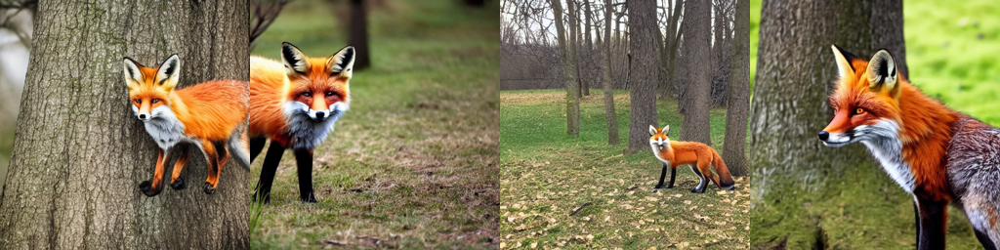

In [4]:
prompt = "a photo of a fox beside a tree"
text_conditioned_outputs = pipeline.text2img_prediction(prompt, num_images_per_prompt=4).images
display_alongside_batch(text_conditioned_outputs)

<div class="alert alert-info">
<b>Note:</b> When performing text-conditioned image synthesis for <emph>"a photo of a red tiger in green field"</emph>, the generated images are typically <b>realistic</b> photos of <emph>"a tiger in a green field"</emph>.
</div>

## Stroke Guided Image Synthesis

A popular idea in controllable image synthesis is to use an additional guidance input (typically containing coarse user scribbles) to control the contents of the output image. The text-prompt controls the overall semantics while the coarse user scribbles provide control over color composition and pllacement of different objcts in the final image.

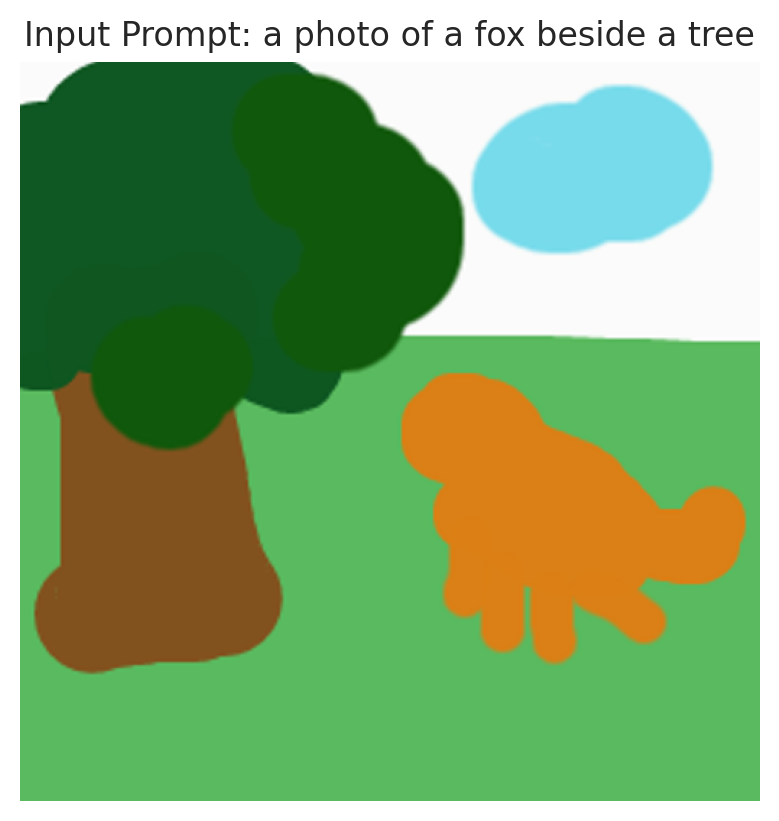

In [5]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a photo of a fox beside a tree"
stroke_img = Image.open('../input-images/fox.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

### SDEdit-based Standard Img2Img

A popular approach when performing guided image synthesis is to use the standard SDEdit based Img2Img generation

  0%|          | 0/40 [00:00<?, ?it/s]

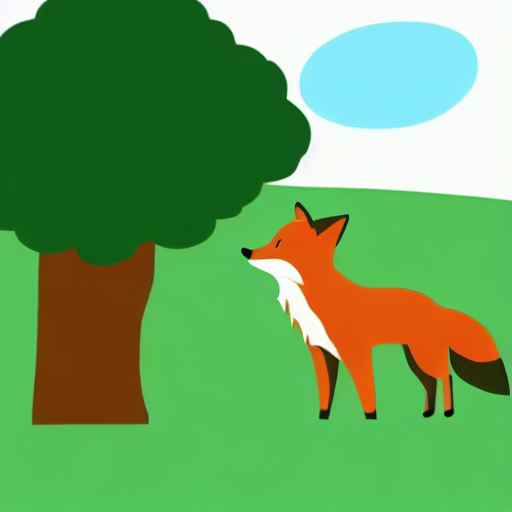

In [6]:
# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)
display(out)

<div class="alert alert-info">
<b>Note:</b> However, when additionally conditioning on a user-scribble based input, prior work can lead to outputs which lack details are are thus not realistic photos (as in the prompt).
</div>

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

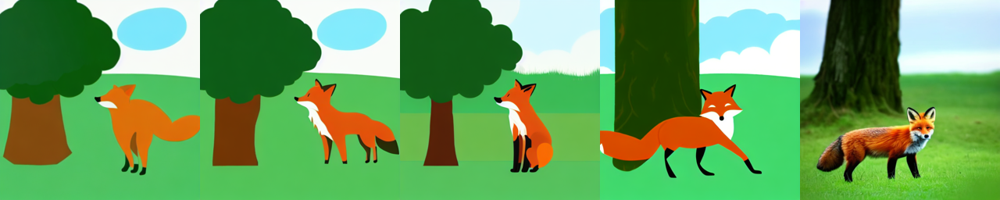

In [7]:
# perform img2img guided synthesis using sdedit under different hyperparameter selection
out_list = []
for strength in [0.7,0.8,0.9,0.95,0.99]:
    generator = torch.Generator(device=device).manual_seed(seed)
    out = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, strength = strength, generator=generator)
    out_list.append(out)

display_alongside_batch(out_list)

<div class="alert alert-info">
<b>Note:</b> For low value of $t_0$ SDEdit leads to faithful but unrealistic images. Increasing $t_0$ improves realism but faithfulness (position of the tiger) with the provided reference decreases.
</div>

### GradOP+ Guided Image Synthesis

To address the above problem, we propose a training-free approach which helps the diffusion model generate more realistic ouptut images while maintaining faithfulness with the reference input.

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


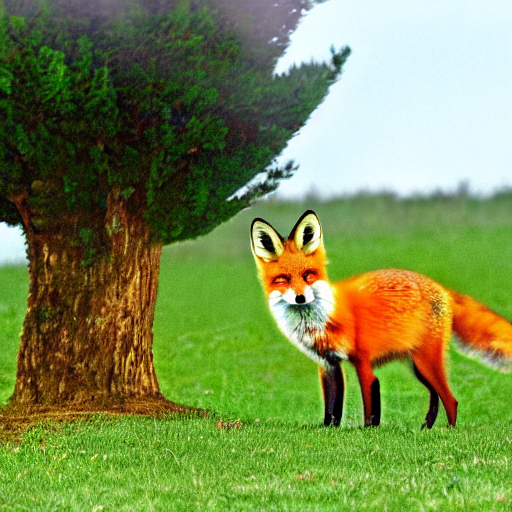

In [13]:
# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=3, grad_steps_per_iter=12, generator=generator)
display(out)

<div class="alert alert-info">
<b>Note:</b> GradOP+ helps in generating more realistic image outputs while maintaining faithfulness with the input user scribbles.
</div>

## Other Examples

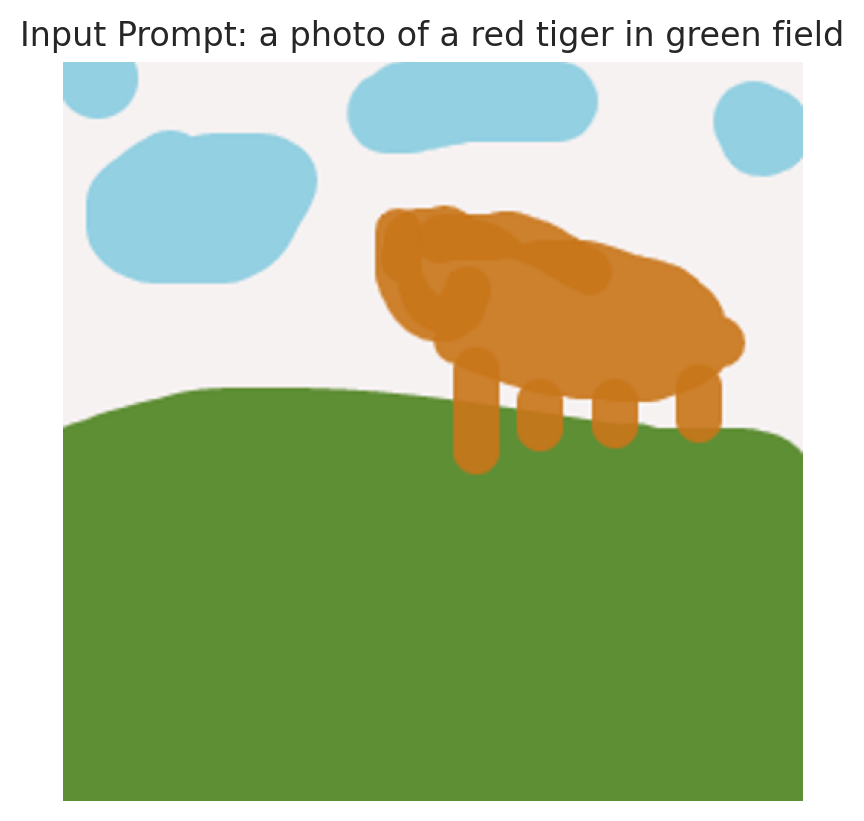

In [15]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a photo of a red tiger in green field"
stroke_img = Image.open('../input-images/tiger.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


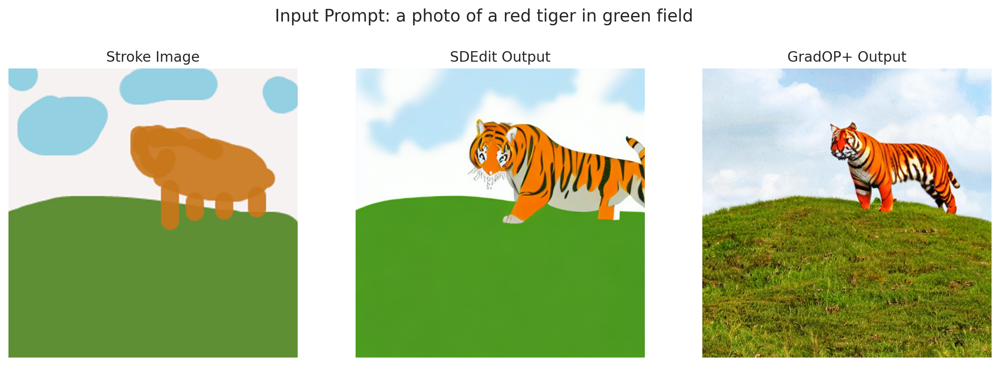

In [16]:
# show comparisons

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_sdedit = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_gradop_plus = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=3, grad_steps_per_iter=12, generator=generator)

fig, axs = plt.subplots(1, 3, figsize=(15,5))  # create a figure with 1 row and 3 columns of subplots

# Show images
axs[0].imshow(stroke_img)
axs[1].imshow(out_sdedit)
axs[2].imshow(out_gradop_plus)

# Set titles
axs[0].set_title('Stroke Image')
axs[1].set_title('SDEdit Output')
axs[2].set_title('GradOP+ Output')

# Remove axis
for ax in axs:
    ax.axis('off')

# Set super title
fig.suptitle('Input Prompt: {}'.format(prompt))
plt.show()

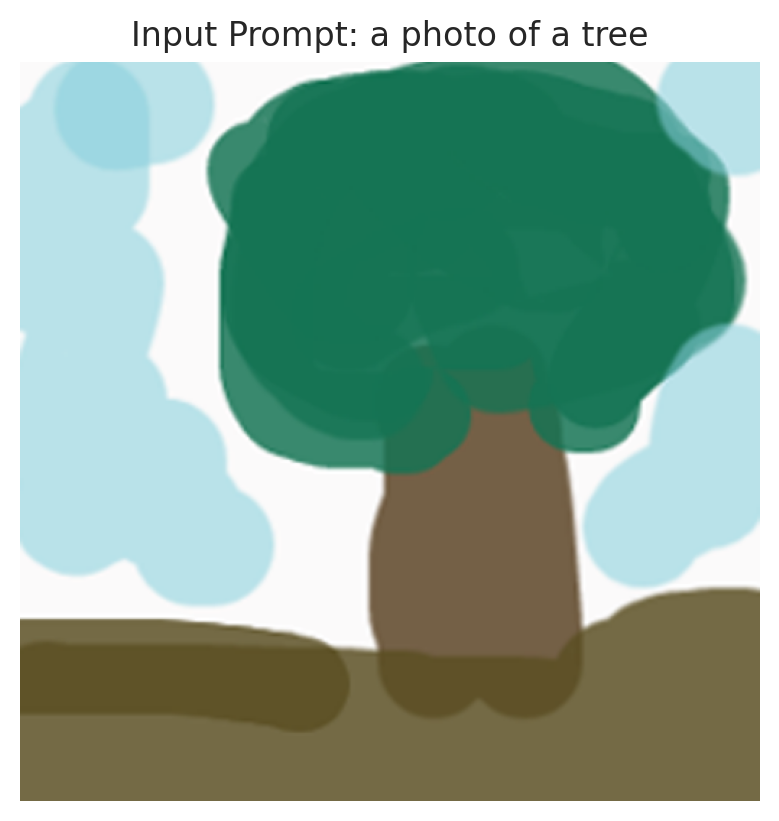

In [17]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a photo of a tree"
stroke_img = Image.open('../input-images/tree.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


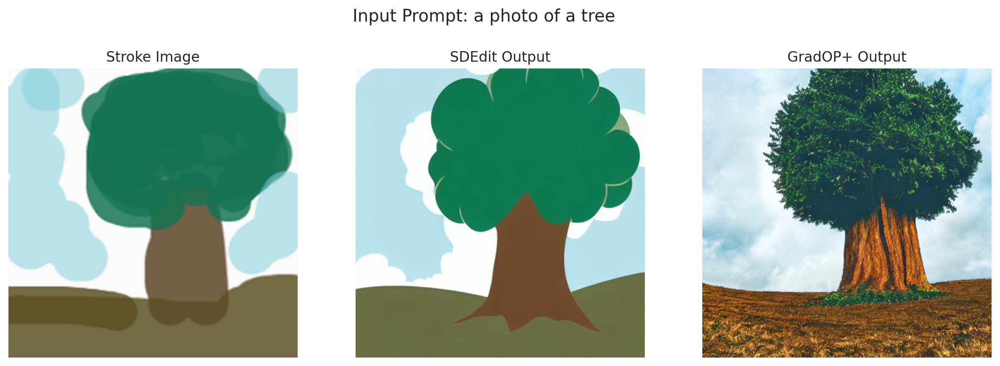

In [18]:
# show comparisons

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_sdedit = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_gradop_plus = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=3, grad_steps_per_iter=12, generator=generator)

fig, axs = plt.subplots(1, 3, figsize=(15,5))  # create a figure with 1 row and 3 columns of subplots

# Show images
axs[0].imshow(stroke_img)
axs[1].imshow(out_sdedit)
axs[2].imshow(out_gradop_plus)

# Set titles
axs[0].set_title('Stroke Image')
axs[1].set_title('SDEdit Output')
axs[2].set_title('GradOP+ Output')

# Remove axis
for ax in axs:
    ax.axis('off')

# Set super title
fig.suptitle('Input Prompt: {}'.format(prompt))
plt.show()

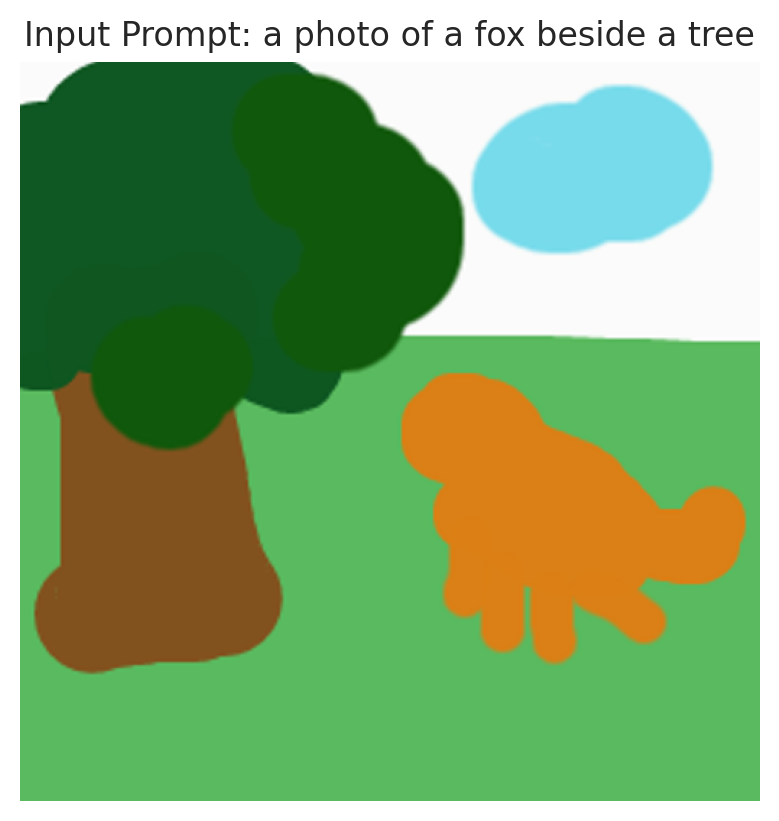

In [19]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a photo of a fox beside a tree"
stroke_img = Image.open('../input-images/fox.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


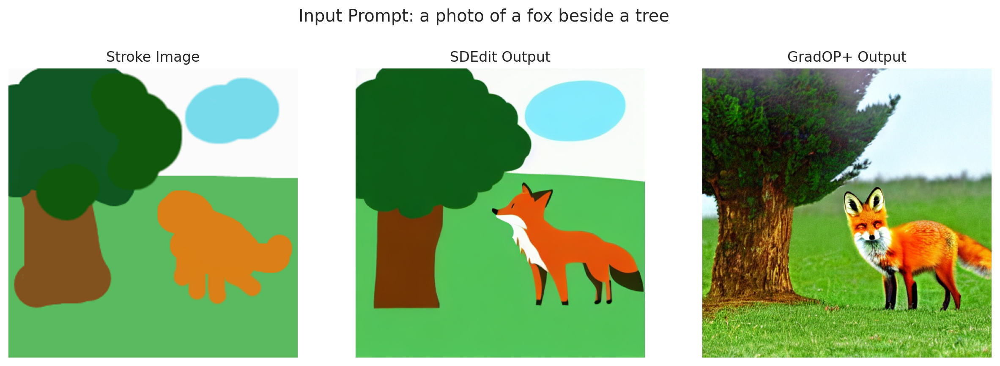

In [20]:
# show comparisons
# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_sdedit = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_gradop_plus = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=3, grad_steps_per_iter=12, generator=generator)

fig, axs = plt.subplots(1, 3, figsize=(15,5))  # create a figure with 1 row and 3 columns of subplots

# Show images
axs[0].imshow(stroke_img)
axs[1].imshow(out_sdedit)
axs[2].imshow(out_gradop_plus)

# Set titles
axs[0].set_title('Stroke Image')
axs[1].set_title('SDEdit Output')
axs[2].set_title('GradOP+ Output')

# Remove axis
for ax in axs:
    ax.axis('off')

# Set super title
fig.suptitle('Input Prompt: {}'.format(prompt))
plt.show()

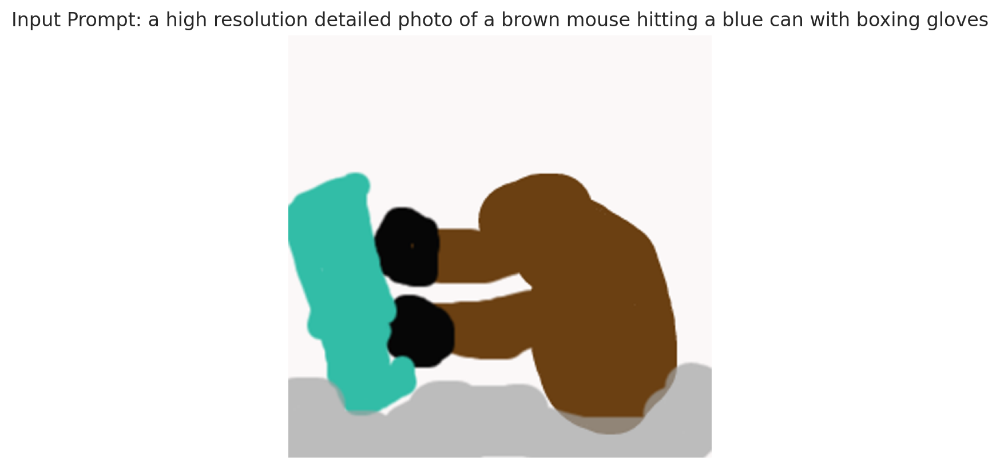

In [21]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a high resolution detailed photo of a brown mouse hitting a blue can with boxing gloves"
stroke_img = Image.open('../input-images/mouse.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


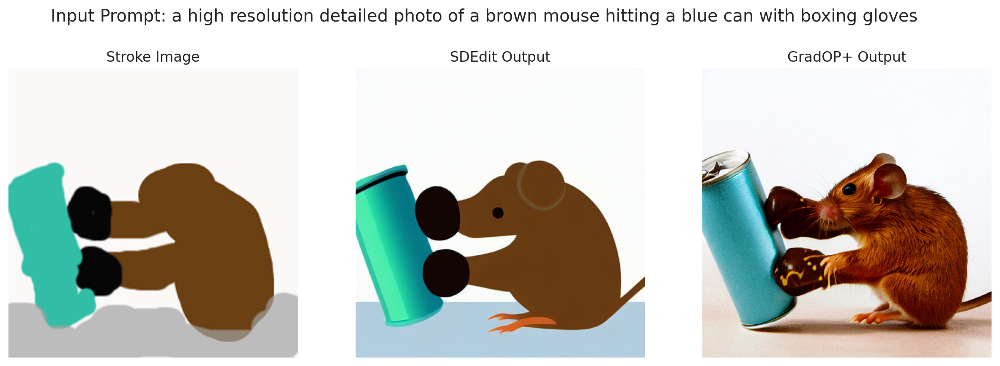

In [22]:
# show comparisons
# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_sdedit = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_gradop_plus = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=3, grad_steps_per_iter=16, generator=generator)

fig, axs = plt.subplots(1, 3, figsize=(15,5))  # create a figure with 1 row and 3 columns of subplots

# Show images
axs[0].imshow(stroke_img)
axs[1].imshow(out_sdedit)
axs[2].imshow(out_gradop_plus)

# Set titles
axs[0].set_title('Stroke Image')
axs[1].set_title('SDEdit Output')
axs[2].set_title('GradOP+ Output')

# Remove axis
for ax in axs:
    ax.axis('off')

# Set super title
fig.suptitle('Input Prompt: {}'.format(prompt))
plt.show()

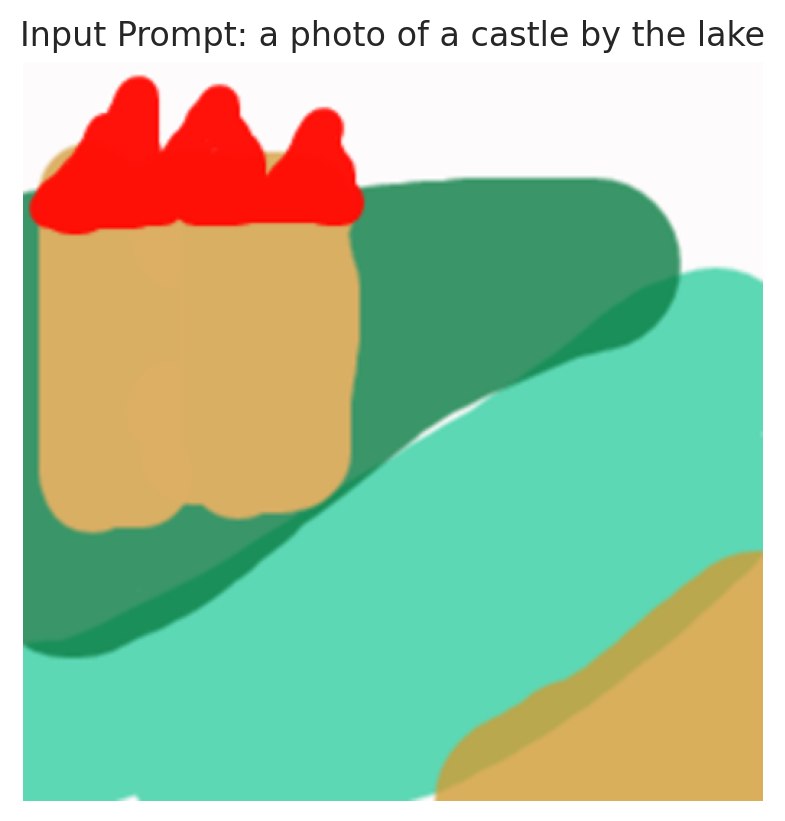

In [24]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a photo of a castle by the lake"
stroke_img = Image.open('../input-images/castle.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


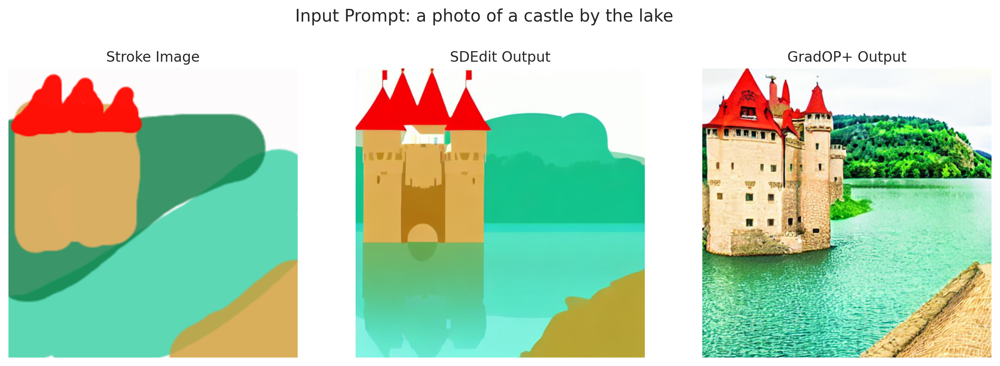

In [25]:
# show comparisons
# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_sdedit = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_gradop_plus = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=4, grad_steps_per_iter=16, generator=generator)

fig, axs = plt.subplots(1, 3, figsize=(15,5))  # create a figure with 1 row and 3 columns of subplots

# Show images
axs[0].imshow(stroke_img)
axs[1].imshow(out_sdedit)
axs[2].imshow(out_gradop_plus)

# Set titles
axs[0].set_title('Stroke Image')
axs[1].set_title('SDEdit Output')
axs[2].set_title('GradOP+ Output')

# Remove axis
for ax in axs:
    ax.axis('off')

# Set super title
fig.suptitle('Input Prompt: {}'.format(prompt))
plt.show()

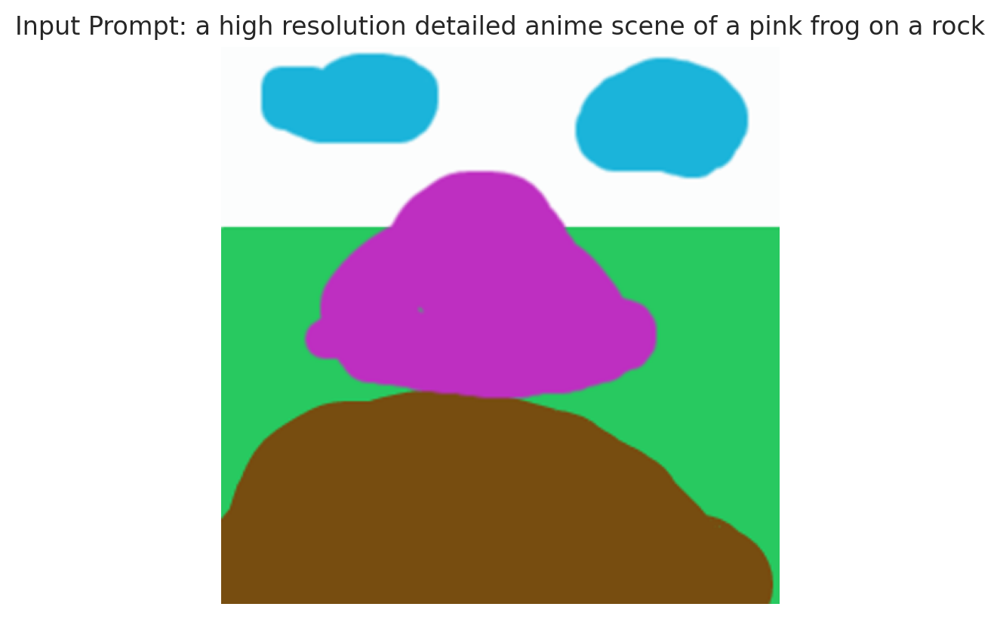

In [26]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a high resolution detailed anime scene of a pink frog on a rock"
stroke_img = Image.open('../input-images/pink-frog.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


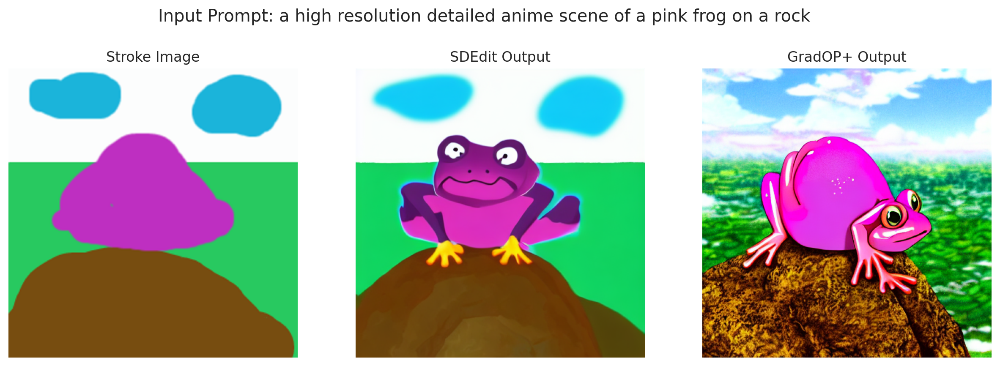

In [27]:
# show comparisons
# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_sdedit = pipeline.sdedit_img2img(prompt=prompt, image=stroke_img, generator=generator)

# perform img2img guided synthesis using sdedit
generator = torch.Generator(device=device).manual_seed(seed)
out_gradop_plus = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=3, grad_steps_per_iter=12, generator=generator)

fig, axs = plt.subplots(1, 3, figsize=(15,5))  # create a figure with 1 row and 3 columns of subplots

# Show images
axs[0].imshow(stroke_img)
axs[1].imshow(out_sdedit)
axs[2].imshow(out_gradop_plus)

# Set titles
axs[0].set_title('Stroke Image')
axs[1].set_title('SDEdit Output')
axs[2].set_title('GradOP+ Output')

# Remove axis
for ax in axs:
    ax.axis('off')

# Set super title
fig.suptitle('Input Prompt: {}'.format(prompt))
plt.show()

<div class="alert alert-info">
<b>Note:</b> GradOP+ helps in generating more realistic image outputs while maintaining faithfulness with the input user scribbles.
</div>

## Variation with Number of Gradient Steps for Optimization

A key component of the proposed GradOP/GradOP+ solution, is to model the guided image synthesis problem as a constrained optimization problem and solve the same approximately using simple gradient descent. In this section, we visualize the variation in output performance as the number of gradient descent steps are increased.

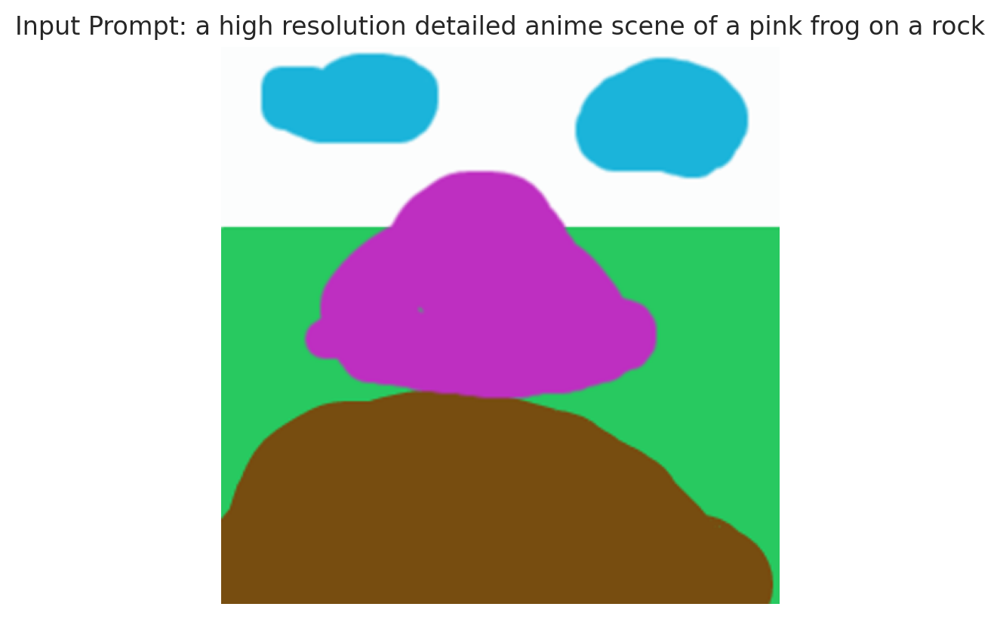

In [28]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a high resolution detailed anime scene of a pink frog on a rock"
stroke_img = Image.open('../input-images/pink-frog.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

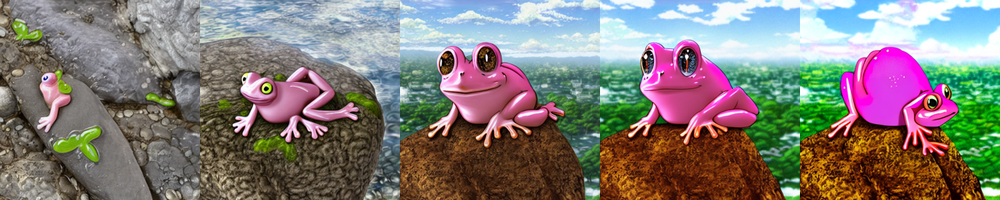

In [29]:
out_list = []
num_iterative_steps = 3
for grad_steps_per_iter in [0,2,4,8,12]:
    # perform img2img guided synthesis using sdedit
    generator = torch.Generator(device=device).manual_seed(seed)
    out = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=num_iterative_steps, 
                                          grad_steps_per_iter=grad_steps_per_iter, generator=generator)
    out_list.append(out)


display_alongside_batch(out_list)

<div class="alert alert-info">
<b>Note:</b> As the number of gradient steps for GradOP+ optimization increase (left to right) the output converges to more and more faithful (yet realistic) representation of the input reference painting / scribbles.
</div>

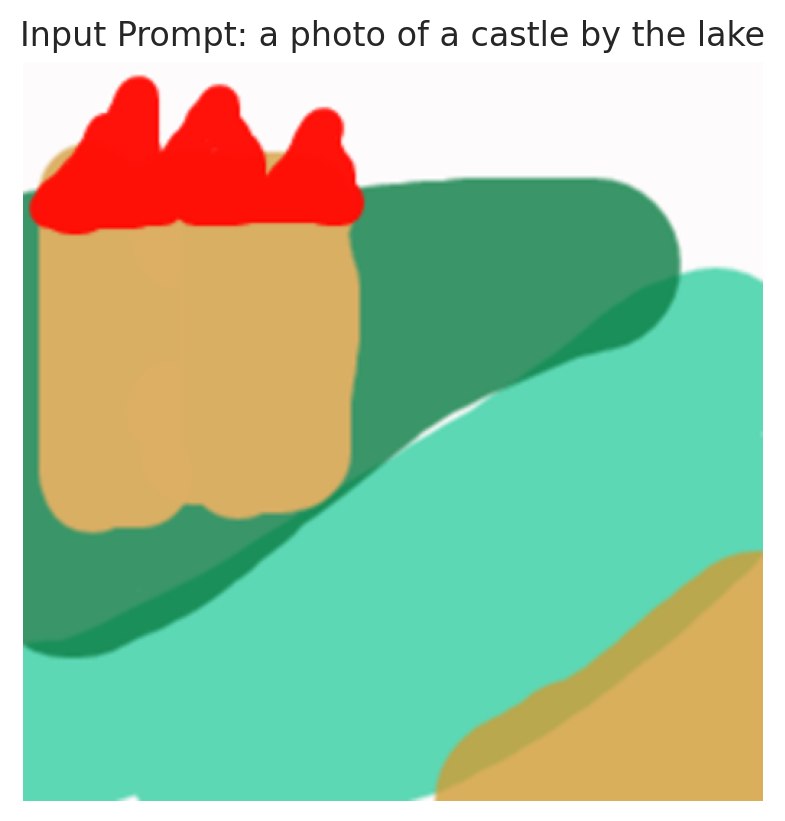

In [30]:
# define the guidance inputs: 1) text prompt and 2) guidance image containing coarse scribbles
seed = 0
prompt = "a photo of a castle by the lake"
stroke_img = Image.open('../input-images/castle.png').convert('RGB').resize((512,512))

# show guidance inputs
plt.imshow(stroke_img)
plt.axis(False)
plt.title("Input Prompt: {}".format(prompt))
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

../pipeline_gradop_stroke2img.py:555: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out_latent = torch.tensor(latents.clone().detach(),requires_grad=True, dtype=self.vae.dtype)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

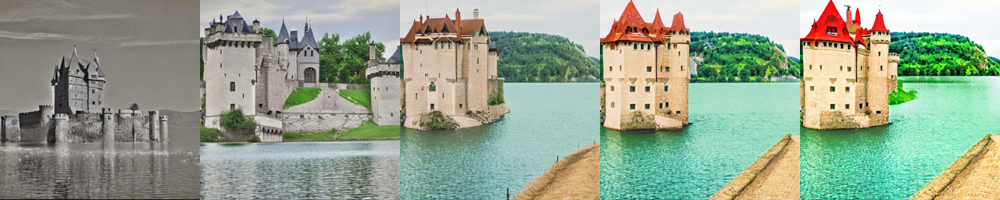

In [31]:
out_list = []
num_iterative_steps = 4
for grad_steps_per_iter in [0,4,8,12,16]:
    # perform img2img guided synthesis using sdedit
    generator = torch.Generator(device=device).manual_seed(seed)
    out = pipeline.gradop_plus_stroke2img(prompt, stroke_img, strength=0.8, num_iterative_steps=num_iterative_steps, 
                                          grad_steps_per_iter=grad_steps_per_iter, generator=generator)
    out_list.append(out)


display_alongside_batch(out_list)

<div class="alert alert-info">
<b>Note:</b> As the number of gradient steps for GradOP+ optimization increase (left to right) the output converges to more and more faithful (yet realistic) representation of the input reference painting / scribbles.
</div>

___